<a href="https://colab.research.google.com/github/Siddha-Regilla/Data-Science-Assignments---ExcelR/blob/main/Assignment_5_EDA_1_01_07_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
#Importing Library
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt # for visualizations
import seaborn as sns # for visualizations
import scipy
import warnings

In [2]:
#Importing functions from the above library
from scipy import stats
from numpy import set_printoptions
from sklearn.preprocessing import MinMaxScaler # for normalization
from sklearn.preprocessing import StandardScaler # for standardization
warnings.filterwarnings('ignore')

# **1.	Data Cleaning and Preparation:**

    ●	Load the dataset into a DataFrame or equivalent data structure.

    ●	Handle missing values appropriately (e.g., imputation, deletion).

    ●	Identify and correct any inconsistencies in data types (e.g., numerical values stored as strings).

    ●	Detect and treat outliers if necessary.

In [3]:
# Upload dataset - Cardiotocographic.csv
#Read the dataset
data = pd.read_csv("Cardiotocographic.csv")

Dataset:
1.	LB - "Baseline Fetal Heart Rate (FHR)" which represents the average fetal heart rate over a period.
2.	AC - "Accelerations" in the FHR. Accelerations are usually a sign of fetal well-being.
3.	FM - "Fetal Movements" detected by the monitor.
4.	UC - "Uterine Contractions", which can impact the FHR pattern.
5.	DL - "Decelerations Late" with respect to uterine contractions, which can be a sign of fetal distress.
6.	DS - "Decelerations Short" or decelerations of brief duration.
7.	DP - "Decelerations Prolonged", or long-lasting decelerations.
8.	ASTV - "Percentage of Time with Abnormal Short Term Variability" in the FHR.
9.	MSTV - "Mean Value of Short Term Variability" in the FHR.
10.	ALTV - "Percentage of Time with Abnormal Long Term Variability" in the FHR.
11.	MLTV - "Mean Value of Long Term Variability" in the FHR.


In [4]:
data

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
0,120.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,73.0,0.5,43.000000,2.4,64.0,0.999926,2.000000
1,132.000000,0.006380,0.000000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.000000
2,133.000000,0.003322,0.000000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.000000
3,134.000000,0.002561,0.000000,0.007742,0.002561,0.0,0.0,16.0,2.4,0.000000,23.0,117.0,1.000000,1.000000
4,131.948232,0.006515,0.000000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.000000,0.000000,0.961268,0.007426,0.000000,0.0,0.0,79.0,0.2,25.000000,7.2,40.0,0.000000,2.000000
2122,140.000000,0.000775,0.000000,0.006979,0.000000,0.0,0.0,78.0,0.4,22.000000,7.1,66.0,1.000000,2.000000
2123,140.000000,0.000980,0.000000,0.006863,0.000000,0.0,0.0,79.0,0.4,20.000000,6.1,67.0,1.000000,1.990464
2124,140.000000,0.000679,0.000000,0.006110,0.000000,0.0,0.0,78.0,0.4,27.000000,7.0,66.0,1.000000,2.000000


In [5]:
#To understand shape of dataset, the no. of null values if present in the dataset and identify the data types of each column
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2126 entries, 0 to 2125
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   LB        2105 non-null   float64
 1   AC        2106 non-null   float64
 2   FM        2126 non-null   float64
 3   UC        2126 non-null   float64
 4   DL        2126 non-null   float64
 5   DS        2105 non-null   float64
 6   DP        2105 non-null   float64
 7   ASTV      2126 non-null   float64
 8   MSTV      2126 non-null   float64
 9   ALTV      2126 non-null   float64
 10  MLTV      2105 non-null   float64
 11  Width     2105 non-null   float64
 12  Tendency  2105 non-null   float64
 13  NSP       2105 non-null   float64
dtypes: float64(14)
memory usage: 232.7 KB


In [6]:
# Checking the count of null values we have in the dataset
data.isnull().sum()

LB          21
AC          20
FM           0
UC           0
DL           0
DS          21
DP          21
ASTV         0
MSTV         0
ALTV         0
MLTV        21
Width       21
Tendency    21
NSP         21
dtype: int64

In [7]:
# Using the auto EDA method we develop a report to get a rough over view of the dataset
# Auto EDA method used will be - Pandas Profiling

Performing Imputation and removing outliers and duplicate values

In [8]:
# Columns with missing values - LB, AC, DS, DP, MLTV, Width, Tendency, NSP
# As all the columns are numeric so we perform either mean or median impputation.
# As mean values get affected by outliers, i am performing median imputation technique

In [9]:
# To avoid losing the original dataset, creating a new variable and performing EDA with it
data_cleaned = data.copy()

In [10]:
# Finding the median value for LB column
median_LB = data_cleaned['LB'].median()
print("Median LB = ",median_LB)

Median LB =  133.0


In [11]:
# Finding the median value for AC column
median_AC = data_cleaned['AC'].median()
print("Median AC = ",median_AC)

Median AC =  0.001633991


In [12]:
# Finding the median value for DS column
median_DS = data_cleaned['DS'].median()
print("Median DS = ",median_DS)
data_cleaned['DP'].value_counts()
mean_DS = data_cleaned['DS'].mean()
print("Mean DS = ",mean_DS)
mode_ds = data_cleaned['DS'].mode()
print("Mode DS = ",mode_ds)

Median DS =  0.0
Mean DS =  2.5089835057102827e-06
Mode DS =  0    0.0
Name: DS, dtype: float64


In [13]:
# Finding the median value for DP column
median_DP = data_cleaned['DP'].median()
print("Median DP = ",median_DP)
#data_cleaned['DP'].value_counts()
mean_DP = data_cleaned['DP'].mean()
print("Mean DP = ",mean_DP)
mode_dp = data_cleaned['DP'].mode()
print("Mode DP = ",mode_dp)

Median DP =  0.0
Mean DP =  0.00017515121174634704
Mode DP =  0    0.0
Name: DP, dtype: float64


In [14]:
# Finding the median value for MLTV column
median_MLTV = data_cleaned['MLTV'].median()
print("Median MLTV = ",median_MLTV)

Median MLTV =  7.4


In [15]:
# Finding the median value for Width column
median_Width = data_cleaned['Width'].median()
print("Median Width = ",median_Width)

Median Width =  67.0


In [16]:
# Finding the median value for Tendency column
median_Tendency = data_cleaned['Tendency'].median()
print("Median Tendency = ",median_Tendency)

Median Tendency =  0.0


In [17]:
# Finding the median value for NSP column
median_NSP = data_cleaned['NSP'].median()
print("Median NSP = ",median_NSP)

Median NSP =  1.0


In [18]:
# Performing median imputation on these columns - - LB, AC, DS, DP, MLTV, Width, Tendency, NSP
data_cleaned['LB'] = data_cleaned['LB'].fillna(median_LB)
data_cleaned['AC'] = data_cleaned['AC'].fillna(median_AC)
data_cleaned['DS'] = data_cleaned['DS'].fillna(median_DS)
data_cleaned['DP'] = data_cleaned['DP'].fillna(median_DP)
data_cleaned['MLTV'] = data_cleaned['MLTV'].fillna(median_MLTV)
data_cleaned['Width'] = data_cleaned['Width'].fillna(median_Width)
data_cleaned['Tendency'] = data_cleaned['Tendency'].fillna(median_Tendency)
data_cleaned['NSP'] = data_cleaned['NSP'].fillna(median_NSP)

In [19]:
# Rechecking for any null values present in the cleaned data -
data_cleaned.isnull().sum()

LB          0
AC          0
FM          0
UC          0
DL          0
DS          0
DP          0
ASTV        0
MSTV        0
ALTV        0
MLTV        0
Width       0
Tendency    0
NSP         0
dtype: int64

In [20]:
# Checking for any duplicates in the dataset
data_cleaned[data_cleaned.duplicated()].shape

(2, 14)

In [21]:
# This shows which are the duplicated records
data_cleaned[data_cleaned.duplicated()]

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
1115,122.0,0.000000,0.0,0.000000,0.0,0.0,0.0,19.0,1.9,0.0,15.1,39.0,0.0,1.0
1458,148.0,0.004717,0.0,0.002358,0.0,0.0,0.0,40.0,0.9,0.0,10.6,35.0,0.0,1.0


In [22]:
# Dropping the duplicated record
data_cleaned=data_cleaned.drop_duplicates()

In [23]:
# Cross checking for any duplicate values
data_cleaned.duplicated().sum()

0

In [24]:
# For numerical columns we can use - histogram, box plot and discribe() to identify outliers
# For categorical columns we use - bar charts

In [25]:
# Identifying outliers in all the columns using box plot LB, AC, FM, UC, DL, DS, DP, ASTV, MSTV, ALTV, MLTV, Width, Tendency, NSP as they are all numeric

<Axes: >

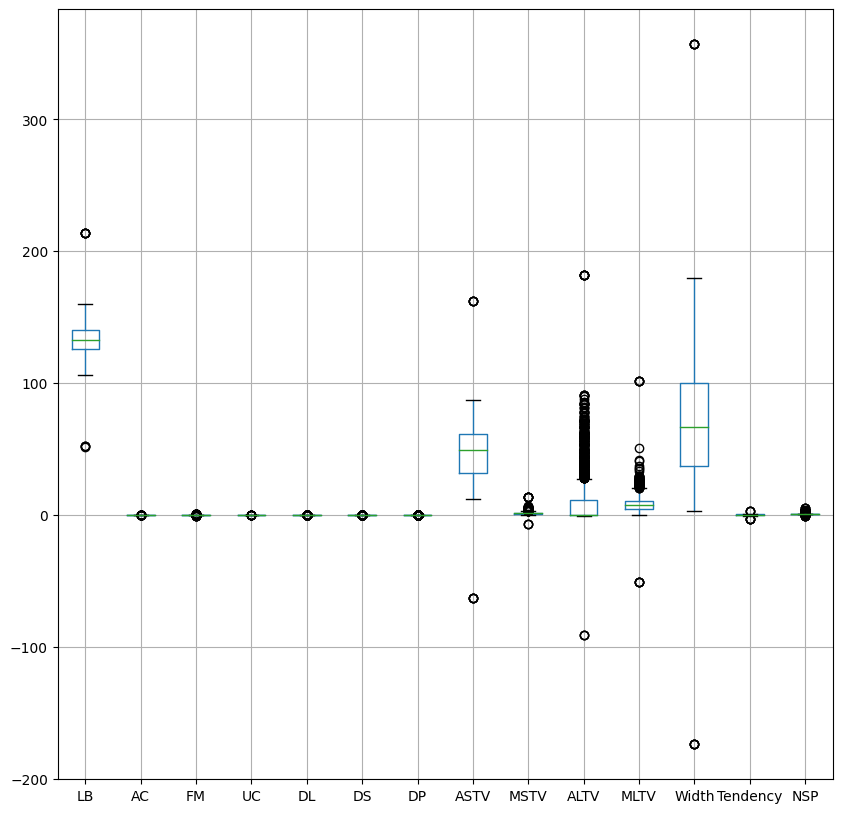

In [26]:
data_cleaned.boxplot(figsize=(10,10))

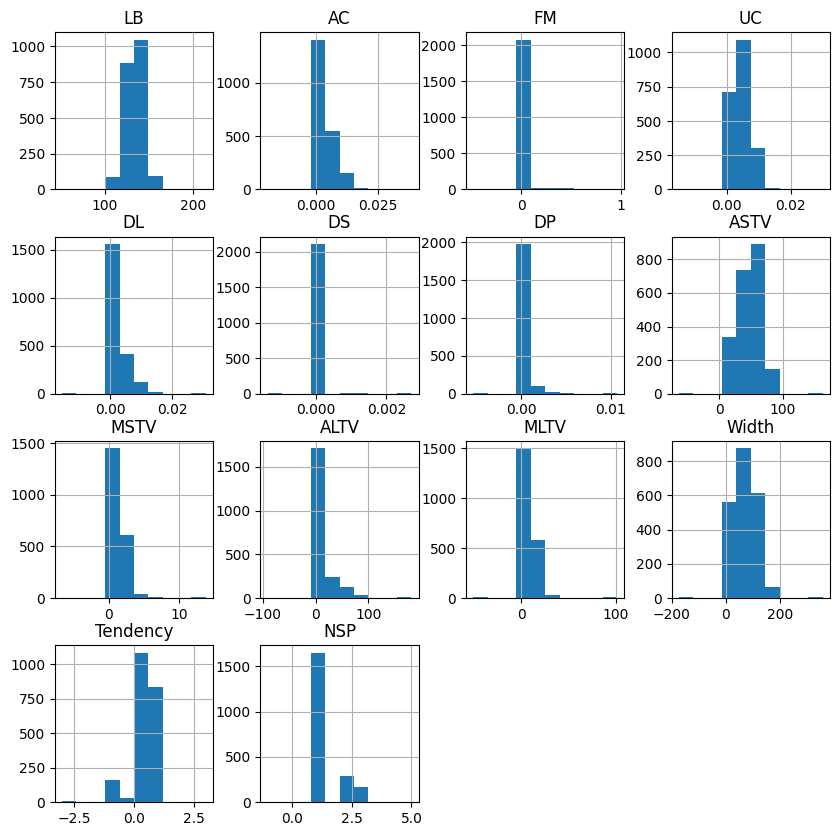

In [27]:
data_cleaned.hist(figsize=(10,10))
plt.show()

In [28]:
# Steps to remove outliers through inter quartile range (IQR)
# 1. Calculate the IQR
# 2. Define the lower and upper bound
# 3. Filter the DataFrame

In [29]:
# Calculate Q1 and Q3
Q3 = data_cleaned.quantile(0.75)
Q1 = data_cleaned.quantile(0.25)

# Calculate the IQR
IQR = Q3 - Q1

# Define the lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter the DataFrame to remove outliers
# Any value that falls below lower bound or above upper bound are outliers
# ~ sign is used to negate the boolean sign as [data_cleaned < lower_bound] OR [data_cleaned > upper_bound] give true values
data_cleaned1 = data_cleaned[~((data_cleaned < lower_bound) | (data_cleaned > upper_bound)).any(axis=1)]

# Display the cleaned DataFrame
data_cleaned1

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
1,132.000000,0.006380,0.00000,0.006380,0.003190,0.0,0.0,17.0,2.1,0.000000,10.4,130.0,0.000000,1.0
2,133.000000,0.003322,0.00000,0.008306,0.003322,0.0,0.0,16.0,2.1,0.000000,13.4,130.0,0.000000,1.0
4,131.948232,0.006515,0.00000,0.008143,0.000000,0.0,0.0,16.0,2.4,0.000000,19.9,117.0,1.000000,1.0
37,114.000000,0.004559,0.00000,0.004559,0.003040,0.0,0.0,24.0,3.2,0.000000,16.2,134.0,0.000000,1.0
50,133.000000,0.001634,0.00000,0.008086,0.000000,0.0,0.0,29.0,1.3,0.000000,7.4,67.0,0.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2113,136.000000,0.000000,0.00207,0.008282,0.000000,0.0,0.0,67.0,1.5,11.000000,4.7,38.0,0.000000,1.0
2117,140.000000,0.000000,0.00000,0.007812,0.000000,0.0,0.0,79.0,0.3,20.000000,8.5,26.0,1.002932,1.0
2118,140.000000,0.000000,0.00000,0.006470,0.000898,0.0,0.0,79.0,0.5,26.428179,7.0,21.0,1.000000,1.0
2119,140.000000,0.000000,0.00000,0.006764,0.001127,0.0,0.0,79.0,0.6,27.000000,6.4,26.0,1.000000,1.0


<Axes: >

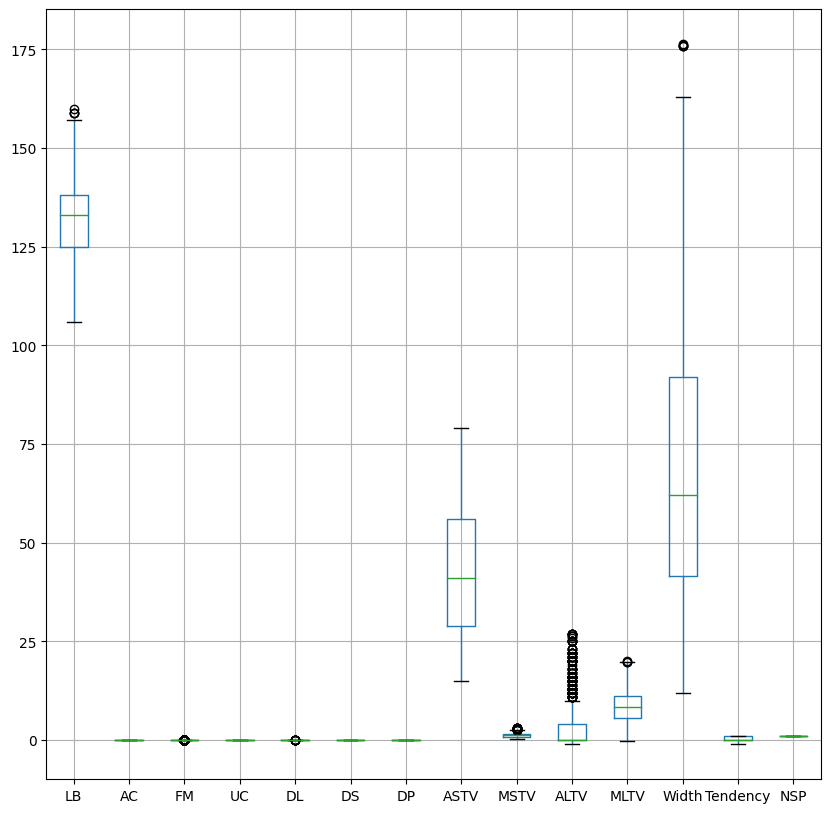

In [30]:
data_cleaned1.boxplot(figsize=(10,10))

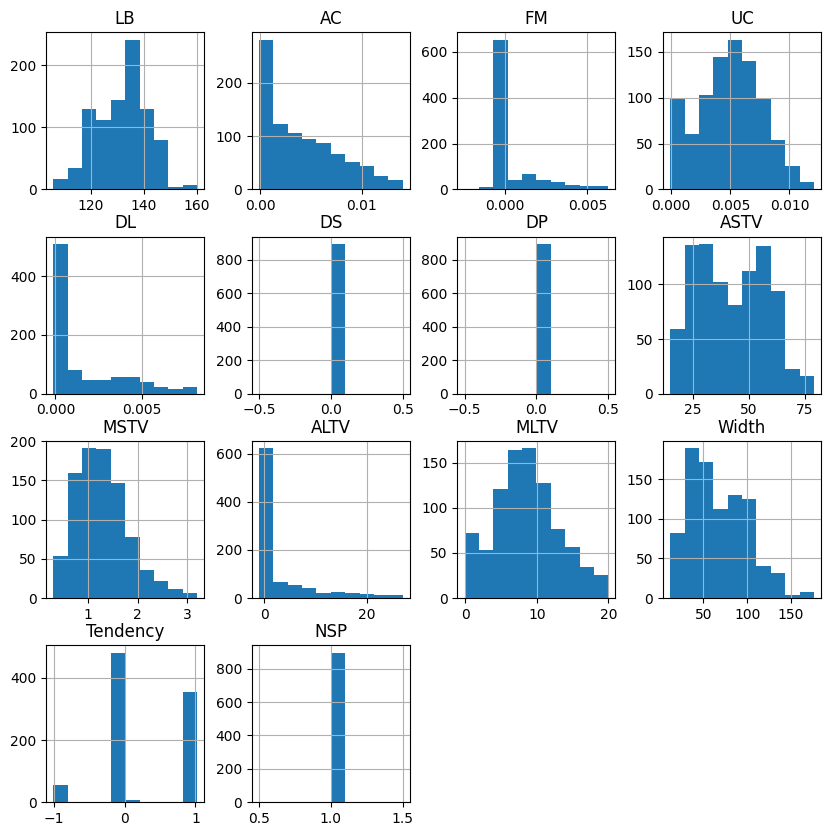

In [31]:
data_cleaned1.hist(figsize=(10,10))
plt.show()

In [32]:
"""# Creating a user define function to remove outliers using IQR
def remove_outliers_iqr(df, column_name):
    # Calculate Q1 (25th percentile) and Q3 (75th percentile)
    Q1 = df[column_name].quantile(0.25)
    Q3 = df[column_name].quantile(0.75)

    # Calculate the IQR
    IQR = Q3 - Q1

    # Define the lower and upper bound
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter the DataFrame
    # Any value that falls below lower bound or above upper bound are outliers
    filtered_df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

    return filtered_df"""

'# Creating a user define function to remove outliers using IQR\ndef remove_outliers_iqr(df, column_name):\n    # Calculate Q1 (25th percentile) and Q3 (75th percentile)\n    Q1 = df[column_name].quantile(0.25)\n    Q3 = df[column_name].quantile(0.75)\n\n    # Calculate the IQR\n    IQR = Q3 - Q1\n\n    # Define the lower and upper bound\n    lower_bound = Q1 - 1.5 * IQR\n    upper_bound = Q3 + 1.5 * IQR\n\n    # Filter the DataFrame\n    # Any value that falls below lower bound or above upper bound are outliers\n    filtered_df = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]\n\n    return filtered_df'

In [33]:
"""from typing import Final
# As all the columns have outliers as seen in the box plots we clean all the columns - LB, AC, FM, UC, DL, DS, DP, ASTV, MSTV, ALTV, MLTV, Width, Tendency, NSP

# Remove outliers from the 'LB' column - 1
Final_df = remove_outliers_iqr(data_cleaned, 'LB')

# Remove outliers from the 'AC' column - 2
Final_df = remove_outliers_iqr(data_cleaned, 'AC')

# Remove outliers from the 'FM' column - 3
Final_df = remove_outliers_iqr(data_cleaned, 'FM')

# Remove outliers from the 'UC' column - 4
Final_df = remove_outliers_iqr(data_cleaned, 'UC')

# Remove outliers from the 'DL' column - 5
Final_df = remove_outliers_iqr(data_cleaned, 'DL')

# Remove outliers from the 'DS' column - 6
Final_df = remove_outliers_iqr(data_cleaned, 'DS')

# Remove outliers from the 'DP' column - 7
Final_df = remove_outliers_iqr(data_cleaned, 'DP')

# Remove outliers from the 'ASTV' column - 8
Final_df = remove_outliers_iqr(data_cleaned, 'ASTV')

# Remove outliers from the 'MSTV' column - 9
Final_df = remove_outliers_iqr(data_cleaned, 'MSTV')

# Remove outliers from the 'ALTV' column - 10
Final_df = remove_outliers_iqr(data_cleaned, 'ALTV')

# Remove outliers from the 'MLTV' column - 11
Final_df = remove_outliers_iqr(data_cleaned, 'MLTV')

# Remove outliers from the 'Width' column - 12
Final_df = remove_outliers_iqr(data_cleaned, 'Width')

# Remove outliers from the 'Tendency' column - 13
Final_df = remove_outliers_iqr(data_cleaned, 'Tendency')

# Remove outliers from the 'NSP' column - 14
Final_df = remove_outliers_iqr(data_cleaned, 'NSP')"""



"from typing import Final\n# As all the columns have outliers as seen in the box plots we clean all the columns - LB, AC, FM, UC, DL, DS, DP, ASTV, MSTV, ALTV, MLTV, Width, Tendency, NSP\n\n# Remove outliers from the 'LB' column - 1\nFinal_df = remove_outliers_iqr(data_cleaned, 'LB')\n\n# Remove outliers from the 'AC' column - 2\nFinal_df = remove_outliers_iqr(data_cleaned, 'AC')\n\n# Remove outliers from the 'FM' column - 3\nFinal_df = remove_outliers_iqr(data_cleaned, 'FM')\n\n# Remove outliers from the 'UC' column - 4\nFinal_df = remove_outliers_iqr(data_cleaned, 'UC')\n\n# Remove outliers from the 'DL' column - 5\nFinal_df = remove_outliers_iqr(data_cleaned, 'DL')\n\n# Remove outliers from the 'DS' column - 6\nFinal_df = remove_outliers_iqr(data_cleaned, 'DS')\n\n# Remove outliers from the 'DP' column - 7\nFinal_df = remove_outliers_iqr(data_cleaned, 'DP')\n\n# Remove outliers from the 'ASTV' column - 8\nFinal_df = remove_outliers_iqr(data_cleaned, 'ASTV')\n\n# Remove outliers from

# ***Pandas Profiling***

In [34]:
!pip install ydata-profiling
!pip install markupsafe
!pip install numpy --upgrade
import pandas as pd
import numpy as np
from ydata_profiling import ProfileReport

data1 = pd.read_csv("Cardiotocographic.csv")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 10.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 30.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 28.5 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=ce0f81b759ef7d50474aa3199844846e58e140a895baa92c23d01b316d006574
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 19.3/19.3 MB 39.8 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 1.25.2
    Uninstalling numpy-1.25.2:
      Successfully uninstalled numpy-1.25.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. Th

In [35]:
# This prepares the report
EDA_report= ProfileReport(data1)
EDA_report.to_file(output_file='report.html')
EDA_report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# **2.	Statistical Summary:**

    ●	Provide a statistical summary for each variable in the dataset, including
        measures of central tendency (mean, median) and dispersion (standard deviation, interquartile range).

    ●	Highlight any interesting findings from this summary.

In [36]:
data_cleaned1.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,895.000000,895.000000,895.000000,895.000000,895.000000,895.0,895.0,895.000000,895.000000,895.000000,895.000000,895.000000,895.000000,895.0
mean,131.849200,0.004051,0.000606,0.004972,0.001549,0.0,0.0,42.472893,1.273709,3.156618,8.577693,67.836460,0.334131,1.0
std,9.377492,0.003725,0.001346,0.002703,0.002215,0.0,0.0,15.057278,0.541722,6.034759,4.462024,32.359271,0.586162,0.0
min,106.000000,-0.000122,-0.002467,-0.000101,-0.000124,0.0,0.0,15.000000,0.300000,-1.043619,-0.136053,12.000000,-1.006614,1.0
25%,125.000000,0.000021,0.000000,0.003170,0.000000,0.0,0.0,29.000000,0.900000,0.000000,5.600000,41.500000,0.000000,1.0
50%,133.000000,0.003315,0.000000,0.005051,0.000000,0.0,0.0,41.000000,1.200000,0.000000,8.400000,62.000000,0.000000,1.0
75%,138.000000,0.006673,0.000336,0.006931,0.003084,0.0,0.0,56.000000,1.600000,4.000000,11.300000,92.000000,1.000000,1.0
max,160.000000,0.014024,0.006272,0.012072,0.008197,0.0,0.0,79.000000,3.200000,27.000000,20.000000,176.310998,1.023635,1.0


In [37]:
Mean = data_cleaned1.mean()

In [38]:
Median = data_cleaned1.median()

In [39]:
Mode = data_cleaned1.mode()

In [40]:
Range = data_cleaned1.max() - data_cleaned1.min()

In [41]:
Variance = data_cleaned1.var()

In [42]:
Std = data_cleaned1.std()

In [43]:
IQR_data = data_cleaned1.quantile(0.75) - data_cleaned1.quantile(0.25)

In [44]:
Col_Name = ['LB', 'AC', 'FM', 'UC', 'DL', 'DS', 'DP', 'ASTV', 'MSTV', 'ALTV', 'MLTV', 'Width', 'Tendency', 'NSP']

In [45]:
data_stat = pd.DataFrame({
    'Mean': Mean,
    'Median': Median,
    'Range': Range,
    'Variance': Variance,
    'Std': Std,
    'IQR': IQR_data
})
data_stat

,Mean,Median,Range,Variance,Std,IQR
LB,131.849200,133.000000,54.000000,87.937352,9.377492,13.000000
AC,0.004051,0.003315,0.014146,0.000014,0.003725,0.006652
FM,0.000606,0.000000,0.008740,0.000002,0.001346,0.000336
UC,0.004972,0.005051,0.012173,0.000007,0.002703,0.003761
DL,0.001549,0.000000,0.008321,0.000005,0.002215,0.003084
DS,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
DP,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ASTV,42.472893,41.000000,64.000000,226.721626,15.057278,27.000000
MSTV,1.273709,1.200000,2.900000,0.293463,0.541722,0.700000
ALTV,3.156618,0.000000,28.043619,36.418313,6.034759,4.000000


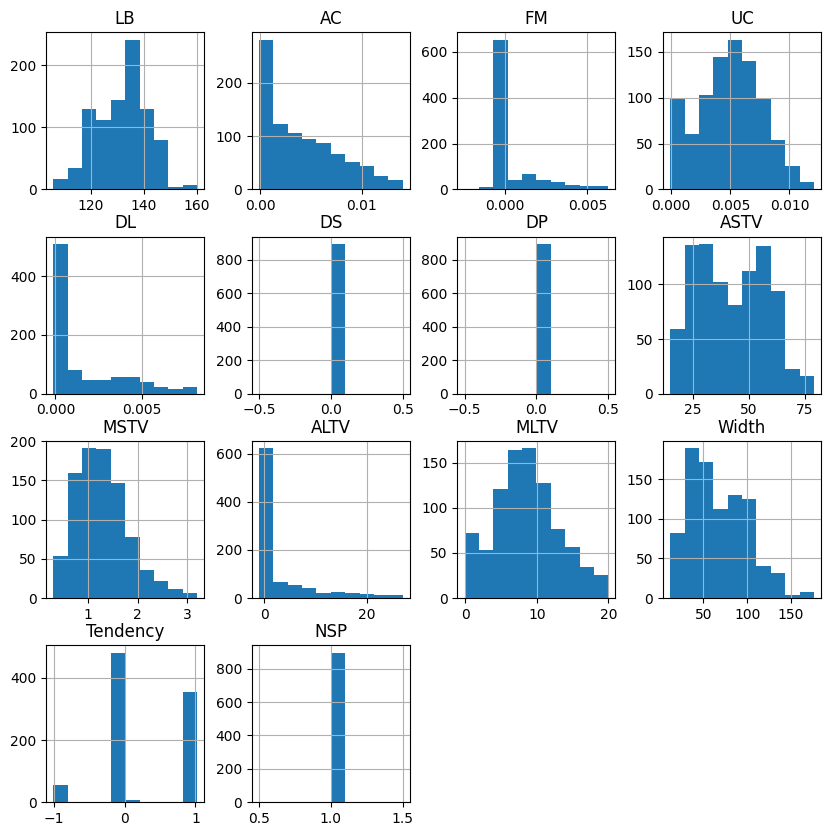

In [46]:
data_cleaned1.hist(figsize=(10,10))
plt.show()

In [47]:
data_cleaned1.describe()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
count,895.000000,895.000000,895.000000,895.000000,895.000000,895.0,895.0,895.000000,895.000000,895.000000,895.000000,895.000000,895.000000,895.0
mean,131.849200,0.004051,0.000606,0.004972,0.001549,0.0,0.0,42.472893,1.273709,3.156618,8.577693,67.836460,0.334131,1.0
std,9.377492,0.003725,0.001346,0.002703,0.002215,0.0,0.0,15.057278,0.541722,6.034759,4.462024,32.359271,0.586162,0.0
min,106.000000,-0.000122,-0.002467,-0.000101,-0.000124,0.0,0.0,15.000000,0.300000,-1.043619,-0.136053,12.000000,-1.006614,1.0
25%,125.000000,0.000021,0.000000,0.003170,0.000000,0.0,0.0,29.000000,0.900000,0.000000,5.600000,41.500000,0.000000,1.0
50%,133.000000,0.003315,0.000000,0.005051,0.000000,0.0,0.0,41.000000,1.200000,0.000000,8.400000,62.000000,0.000000,1.0
75%,138.000000,0.006673,0.000336,0.006931,0.003084,0.0,0.0,56.000000,1.600000,4.000000,11.300000,92.000000,1.000000,1.0
max,160.000000,0.014024,0.006272,0.012072,0.008197,0.0,0.0,79.000000,3.200000,27.000000,20.000000,176.310998,1.023635,1.0


In [48]:
# Following are the statitical summary for all the variables

In [49]:
# 1. LB statitical summary -
# Mean = 131.849 < Median = 133 : the distribution indicates slghtly left skewed data
# The data has low variablility : (std/mean)*100 = 9.377/131.849*100 = 7.11%
# The spread of data is considerable as the min and max values are 106 & 160 and the range is 54

In [50]:
# 2. AC statitical summary - mean = 0.004051, median = 0.003315, range = 0.014146, var = 0.000014, std = 0.003725, IQR = 0.006652
# Mean > Median : the distribution is right skewed
# The data has high variability : CV = 91.95%
# The data is spread out

In [51]:
# 3. FM statistical summary - Mean = 0.000606, median = 0.000000, range = 0.008740, var = 0.000002, std = 0.001346, IQR = 0.000336
# Mean > median : the distribution is right skewed
# both mean and median are close to 0 indicating that the data is centered around 0
# the data has a low spread with some outliers on both sides making the mean > that median

In [52]:
# 4. UC statistical summary - mean = 0.004972, median = 0.005051, range = 0.012173, var = 0.000007, std = 0.002703, IQR = 0.003761
# Mean ~= Median : the distribution indicates very slghtly left skewed data tending towards normal distribution
# Overall lower variability
# Data is moderately spread

In [53]:
# 5. DL statistical summary - Mean = 0.001549, median = 0.000000, range = 0.008321, var = 0.000005, std = 0.002215, IQR = 0.003084
# Mean > Median : strong right skewed distribution
# High spread of data relative to the central value
# high variability
# majority of the values are likely 0 or close to it

In [54]:
# 6. DS statistical summary - mean = 0.000000, median = 0.000000, range = 0.000000, var = 0.000000, std = 0.000000, IQR = 0.000000
# As there is no difference in all the values there is no variability in the data and doesn't aid in predictions

In [55]:
# 7. DP statistical summary - mean = 0.000000, median = 0.000000, range = 0.000000, var = 0.000000, std = 0.000000, IQR = 0.000000
# As there is no difference in all the values there is no variability in the data and doesn't aid in predictions

In [56]:
# 8. ASTV statistical summary - mean = 42.472893, median = 41.000000, range = 64.000000, var = 226.721626, std = 15.057278, IQR = 27.000000
# Mean > Median : suggest a mild right skewed distribution
# Moderate variability compared to its mean
# There is substantial spread but more evenly distributed around the central values

In [57]:
# 9. MSTV statistical summary - mean = 1.273709, median = 1.200000, range = 2.900000, var = 0.293463, std = 0.541722, IQR = 0.700000
# Mean > Median : suggest a mild right skewed distribution
# Moderate to high variability compared to its mean
# There is substantial spread but more evenly distributed around the central values.
# May have potential outliers

In [58]:
# 10. ALTV statistical summary - mean = 3.156618, median = 0.000000, range = 28.043619, var = 36.418313, std = 6.034759, IQR = 4.000000
# Mean > Median : suggest a Strong right skewed distribution
# Extreme variability compared to its mean
# Data is heavily concentrated at 0
# There are some value pulling the mean up significantly indicating rare event occurances

In [59]:
# 11. MLTV statistical summary - mean = 8.577693, median = 8.400000, range = 20.136053, var = 19.909656, std = 4.462024, IQR = 5.700000
# Mean > Median : suggest a slight right skewed distribution
# The values are close, suggesting a nearly symmetrical distribution
# It has moderate spread with considerable variation in the data

In [60]:
# 12. Width statistical summary - mean = 67.836460, median = 62.000000, range = 164.310998, var = 1047.122401, std = 32.359271, IQR = 50.500000
# Mean > Median : suggest a right skewed distribution
# The right skew indicates some high values influencing the distribution
# It has substantial spread with wide variation in the data

In [61]:
# 13. Tendency statistical summary - mean = 0.334131, median = 0.000000, range = 2.030249, var = 0.343586, std = 0.586162, IQR = 1.000000
# Mean > Median : suggest a Strong right skewed distribution
# very high spread relative to the central value and high variability
# the strong right skew, there are likely some high values influencing the distribution

In [62]:
# 14. NSP statistical sumary - mean = 1.000000, median = 1.000000, range = 0.000000, var = 0.000000, std = 0.000000, IQR = 0.000000
# As the mean and the median values are same and there is no variability in the data, this variable doesn't aid in predictions

# **3.	Data Visualization:**
    ●	Create histograms or boxplots to visualize the distributions of various numerical variables.
    ●	Use bar charts or pie charts to display the frequency of categories for categorical variables.
    ●	Generate scatter plots or correlation heatmaps to explore relationships between pairs of variables.
    ●	Employ advanced visualization techniques like pair plots, or violin plots for deeper insights.


<Axes: >

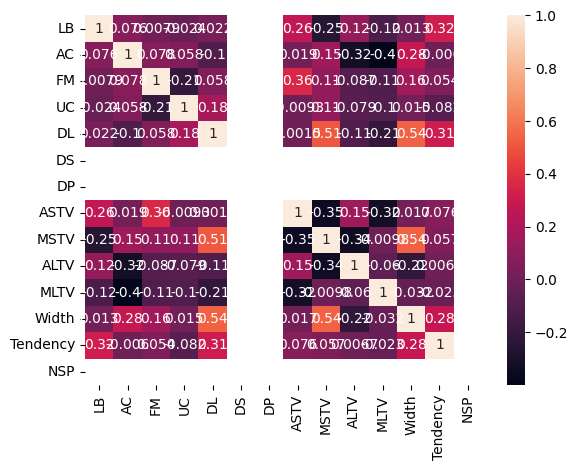

In [63]:
sns.heatmap(data_cleaned1.corr(),annot=True)

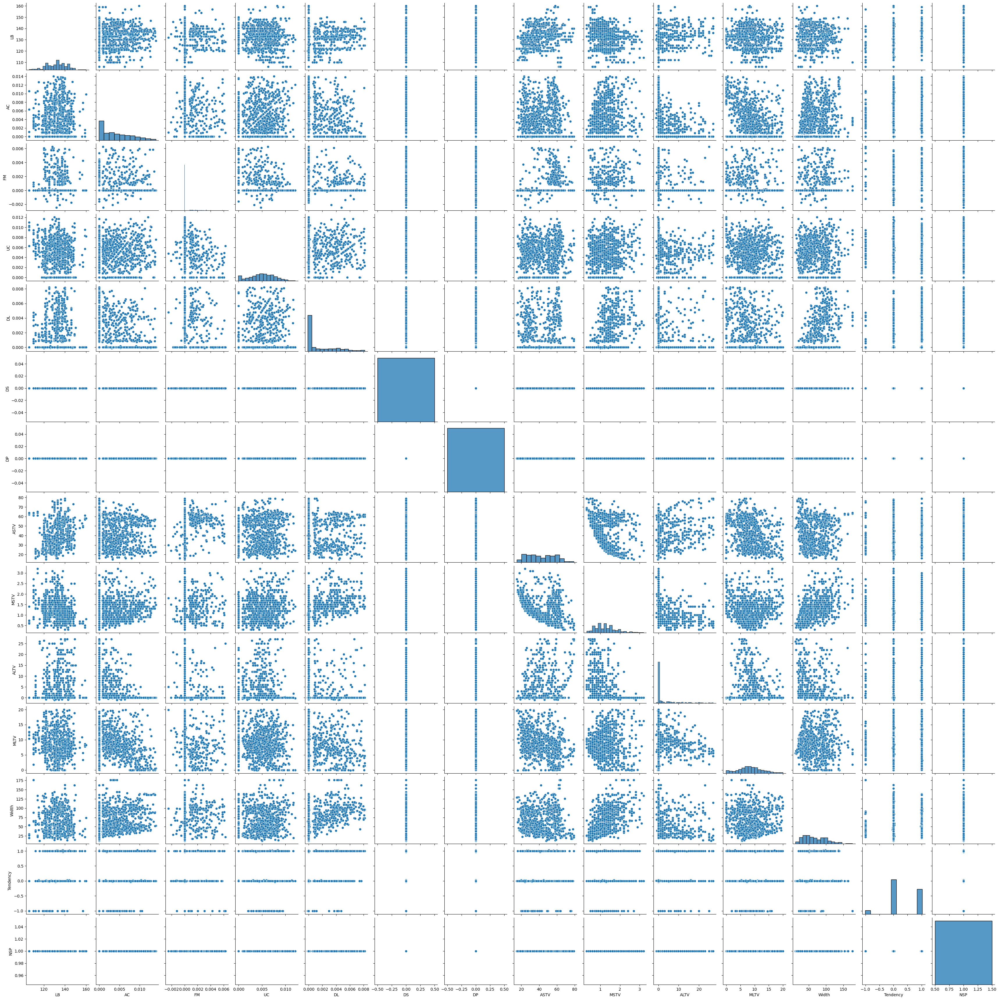

In [64]:
sns.pairplot(data_cleaned1)

In [65]:
data_cleaned1.corr()

,LB,AC,FM,UC,DL,DS,DP,ASTV,MSTV,ALTV,MLTV,Width,Tendency,NSP
LB,1.000000,0.075840,0.007870,-0.024292,0.021620,NaN,NaN,0.262344,-0.253132,0.124672,-0.117551,0.012845,0.315557,NaN
AC,0.075840,1.000000,0.078089,0.058031,-0.104355,NaN,NaN,0.018538,0.154547,-0.324367,-0.399255,0.278869,-0.006035,NaN
FM,0.007870,0.078089,1.000000,-0.207295,0.058147,NaN,NaN,0.362614,0.113580,-0.087467,-0.108788,0.159351,0.053528,NaN
UC,-0.024292,0.058031,-0.207295,1.000000,0.175150,NaN,NaN,-0.009296,0.112453,-0.078789,-0.102655,0.015491,-0.081691,NaN
DL,0.021620,-0.104355,0.058147,0.175150,1.000000,NaN,NaN,0.001472,0.510083,-0.107918,-0.211144,0.537059,0.309206,NaN
DS,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ASTV,0.262344,0.018538,0.362614,-0.009296,0.001472,NaN,NaN,1.000000,-0.346515,0.150406,-0.324859,0.016757,0.075850,NaN
MSTV,-0.253132,0.154547,0.113580,0.112453,0.510083,NaN,NaN,-0.346515,1.000000,-0.336172,-0.009847,0.538891,0.057162,NaN
ALTV,0.124672,-0.324367,-0.087467,-0.078789,-0.107918,NaN,NaN,0.150406,-0.336172,1.000000,-0.059865,-0.215952,0.006651,NaN


In [66]:
# As we can see DS, DP and NSP dont have correlation with any other variable. Therefore are not useful is perdiction. So we can drop these columns

In [67]:
Final_data = data_cleaned1.drop(['DS', 'DP', 'NSP'], axis=1)

In [68]:
Final_data

,LB,AC,FM,UC,DL,ASTV,MSTV,ALTV,MLTV,Width,Tendency
1,132.000000,0.006380,0.00000,0.006380,0.003190,17.0,2.1,0.000000,10.4,130.0,0.000000
2,133.000000,0.003322,0.00000,0.008306,0.003322,16.0,2.1,0.000000,13.4,130.0,0.000000
4,131.948232,0.006515,0.00000,0.008143,0.000000,16.0,2.4,0.000000,19.9,117.0,1.000000
37,114.000000,0.004559,0.00000,0.004559,0.003040,24.0,3.2,0.000000,16.2,134.0,0.000000
50,133.000000,0.001634,0.00000,0.008086,0.000000,29.0,1.3,0.000000,7.4,67.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...
2113,136.000000,0.000000,0.00207,0.008282,0.000000,67.0,1.5,11.000000,4.7,38.0,0.000000
2117,140.000000,0.000000,0.00000,0.007812,0.000000,79.0,0.3,20.000000,8.5,26.0,1.002932
2118,140.000000,0.000000,0.00000,0.006470,0.000898,79.0,0.5,26.428179,7.0,21.0,1.000000
2119,140.000000,0.000000,0.00000,0.006764,0.001127,79.0,0.6,27.000000,6.4,26.0,1.000000


<Axes: >

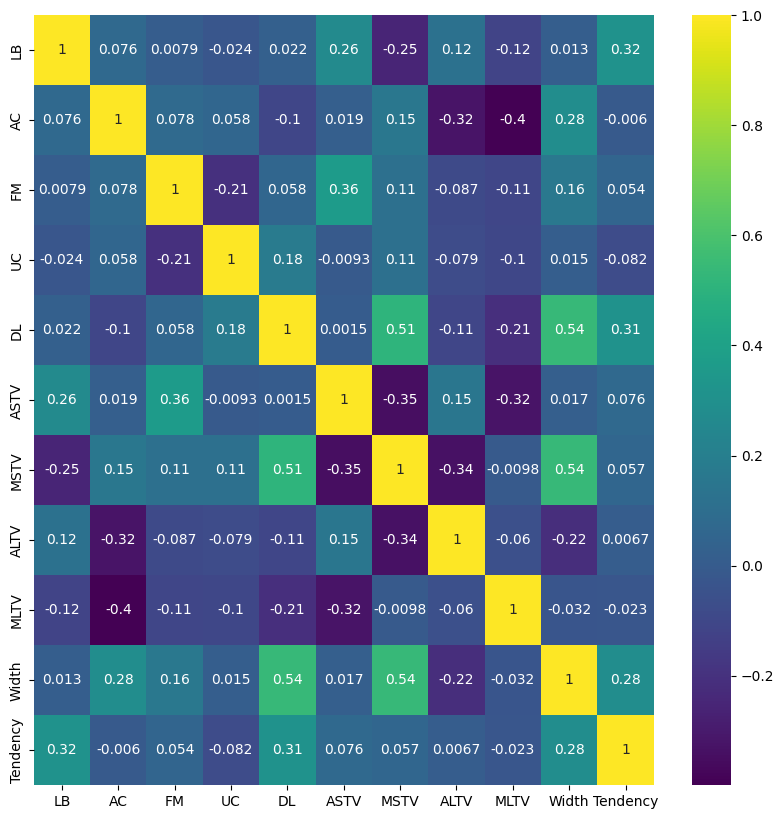

In [69]:
plt.figure(figsize=(10,10))
sns.heatmap(Final_data.corr(),annot=True,cmap='viridis')

# ***Summary***

In [70]:
# Loaded the data and identified their datatypes, null values, duplicate values
# As all the columns were numreic, performed median imputation
# Treated the outliers after detecting them
# Created some visualizations and understood the relation between the variables
# As DS, DP and NSP have no correlation with the other variables dropped those columns as they have only 1 predominant value that doesn't help in predictions
# After viewing the data, it is understood that we can perform unsupervised ML algorithms and understand the trends in the data and form clusters